# Import and set colors

In [1]:
#Import packages
import scanpy as sc
import anndata as ann
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import cm, colors
from gprofiler import gprofiler

import os 

import seaborn as sb
import scvi
from scvi.model.utils import mde
import pymde

Global seed set to 0


In [2]:
plt.rcParams['figure.figsize']=(4,3) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=False, fontsize=12, color_map='plasma')
sc.logging.print_header()

scanpy==1.7.1 anndata==0.7.5 umap==0.5.1 numpy==1.22.3 scipy==1.8.0 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.4


In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# Set project file paths

We set up the file paths to the respective directories.

In [4]:
file_path = '/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/'
#this is my file path please adapt it to your directory

In [5]:
data_dir =file_path +  'data/' 

In [6]:
table_dir = file_path + 'tables'

In [7]:
sc.settings.figdir = file_path + 'figures/'

In [8]:
import datetime

today = datetime.date.today().strftime('%y%m%d') #creates a YYMMDD string of today's date

# Read Data & downstream analysis

In [9]:
adata_postnorm_scvi = sc.read(data_dir + "/230516adata_postnorm_scvi_proc.h5ad")

In [10]:
adata_postnorm_scvi

AnnData object with n_obs × n_vars = 56786 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'leiden13'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'condition_colors', 'dendrogram_leiden_scVI', 'hvg', 'leiden', 'leiden13_colors', 'leiden_colors', 'leiden_scVI_colors', 'neighbors', 'pca', 'rank_genes_treated_annotated', 'sample_id_colors', 'umap'

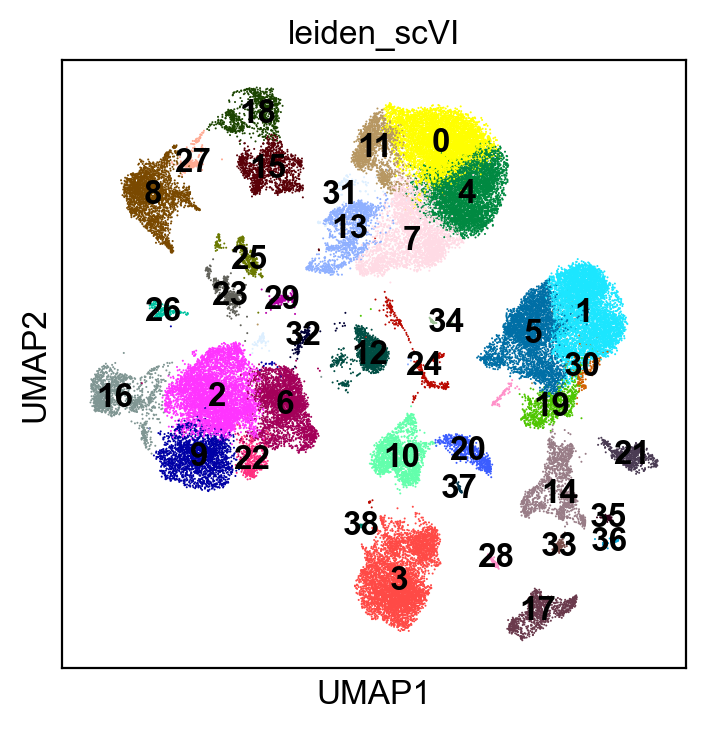

In [11]:
sc.pl.umap(adata_postnorm_scvi,color=['leiden_scVI'], legend_loc='on data')

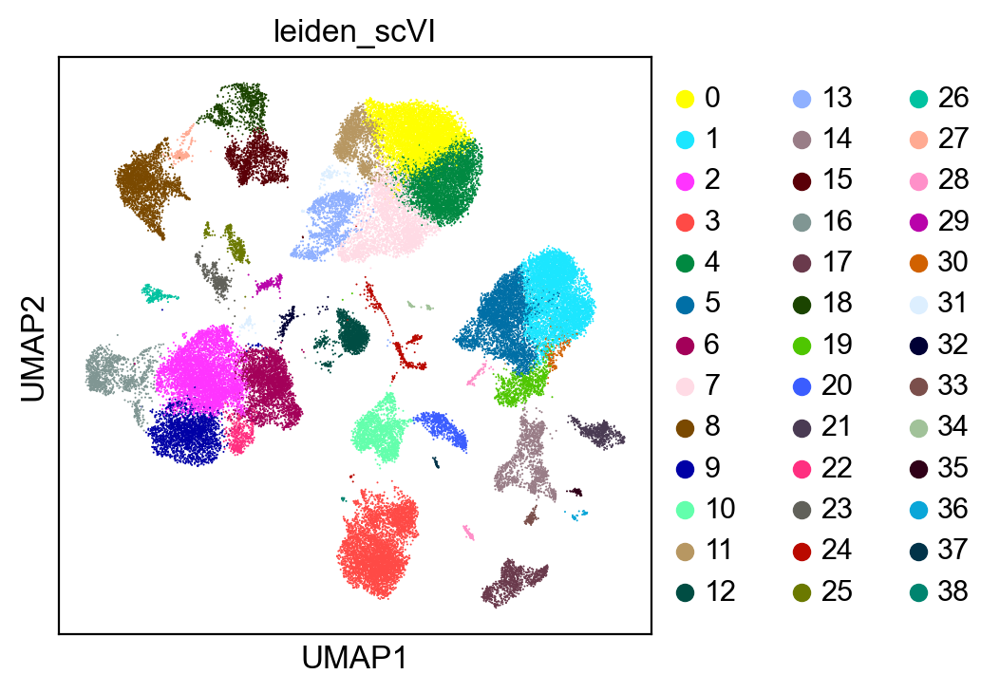

In [12]:
sc.pl.umap(adata_postnorm_scvi,color=['leiden_scVI'])

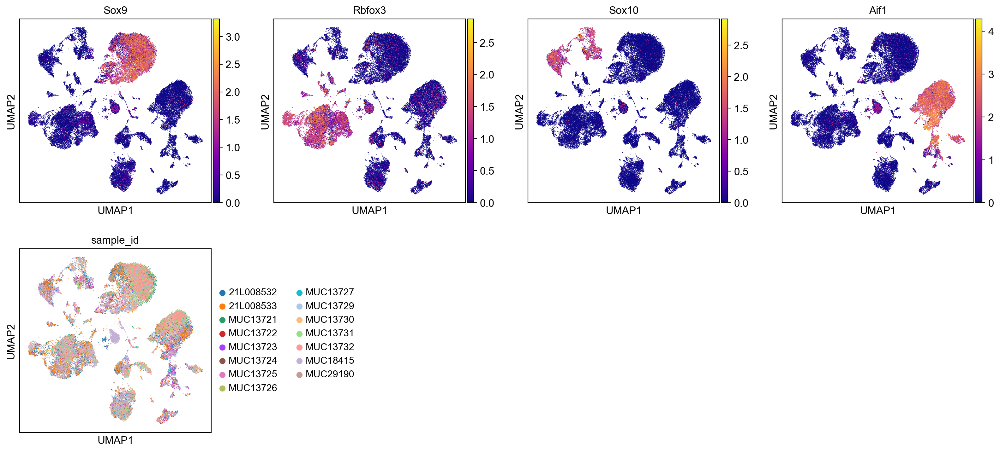

In [13]:
sc.pl.umap(adata_postnorm_scvi,color=['Sox9', 'Rbfox3','Sox10', 'Aif1', 'sample_id'])

In [14]:
sc.tl.rank_genes_groups(adata_postnorm_scvi, groupby='leiden_scVI', key_added='rank_genes_scVI', method='t-test_overestim_var')

ranking genes
    finished: added to `.uns['rank_genes_scVI']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:51)


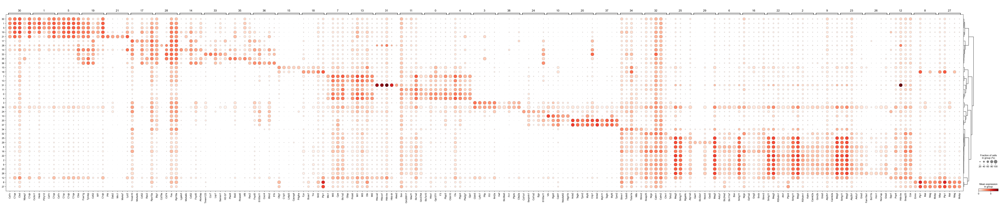

In [15]:
#it uses adata_main_correct.raw which is set to adata, so the results should be similar to the mgs from adata that I think they are
sc.pl.rank_genes_groups_dotplot(adata_postnorm_scvi, n_genes=5, key='rank_genes_scVI' )

In [16]:
adata_postnorm_scvi2=adata_postnorm_scvi.copy()

In [17]:
adata_postnorm_scvi.var["hb"] = adata_postnorm_scvi.var_names.str.contains(("Hb"))

In [18]:
# ribosomal genes
adata_postnorm_scvi.var["ribo"] = adata_postnorm_scvi.var_names.str.startswith(("Rps", "Rpl"))

In [19]:
sc.pp.calculate_qc_metrics(
    adata_postnorm_scvi, qc_vars=["ribo", "hb"], inplace=True, percent_top=[20], log1p=True
)
adata_postnorm_scvi

OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


AnnData object with n_obs × n_vars = 56786 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'leiden13', 'pct_counts_in_top_20_genes', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'hb', 'ribo'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'condition_colors', 'dendro

In [20]:
for i in ['total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb']:
    adata_postnorm_scvi2.obs[i]=adata_postnorm_scvi.obs[i]

In [21]:
adata_postnorm_scvi2

AnnData object with n_obs × n_vars = 56786 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'leiden13', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'condition_colors', 'dendrogram_leiden_scVI', 'hvg', 'leiden', 'leiden1

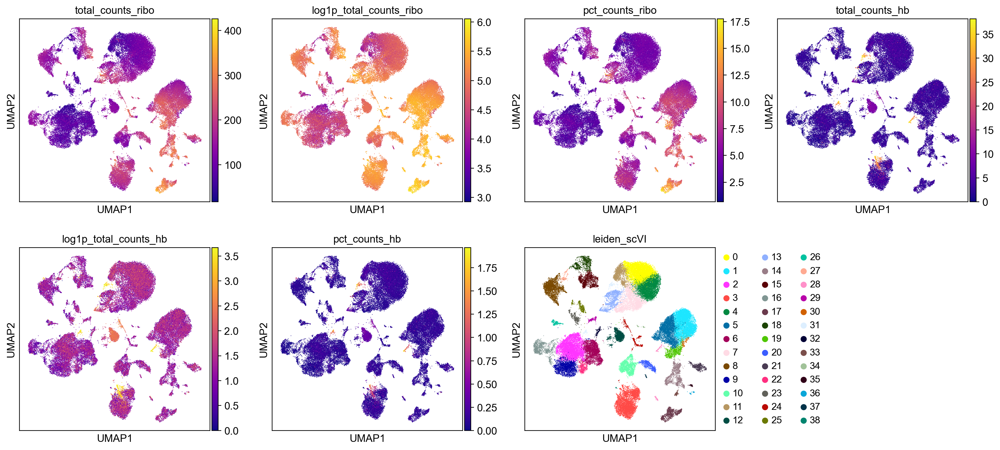

In [22]:
sc.pl.umap(adata_postnorm_scvi,color=['total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'leiden_scVI'])

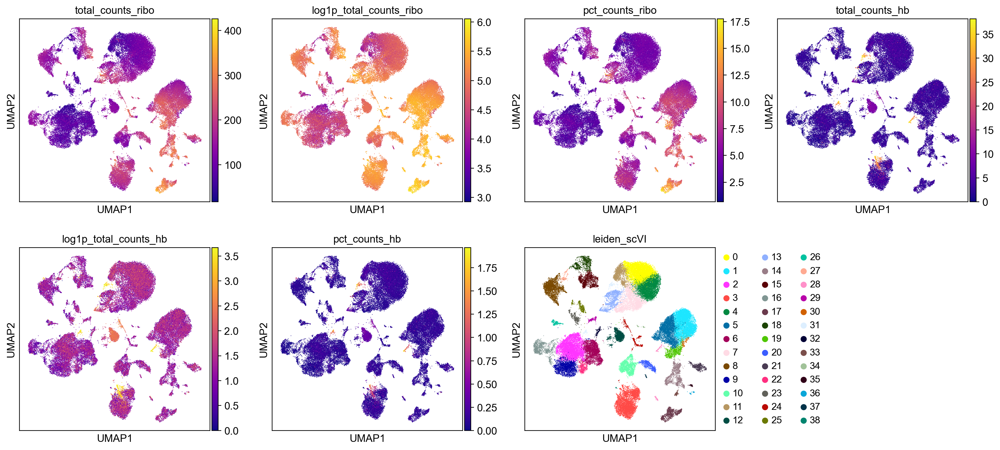

In [23]:
sc.pl.umap(adata_postnorm_scvi2,color=['total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'leiden_scVI'])

In [24]:
adata_postnorm_scvi2 = adata_postnorm_scvi2[~np.in1d(adata_postnorm_scvi2.obs['leiden_scVI'], 
                           ['12'])].copy() #cluster only present in one replicate and having multiple identity

In [25]:
adata_postnorm_scvi.obs['condition'].value_counts()

INTACT       16965
5dpi_CTRL    15898
5dpi_INH     15660
3dpi_INH      4617
3dpi_CTRL     3646
Name: condition, dtype: int64

In [26]:
adata_postnorm_scvi2.obs['condition'].value_counts()

INTACT       16964
5dpi_INH     15658
5dpi_CTRL    14522
3dpi_INH      4615
3dpi_CTRL     3646
Name: condition, dtype: int64

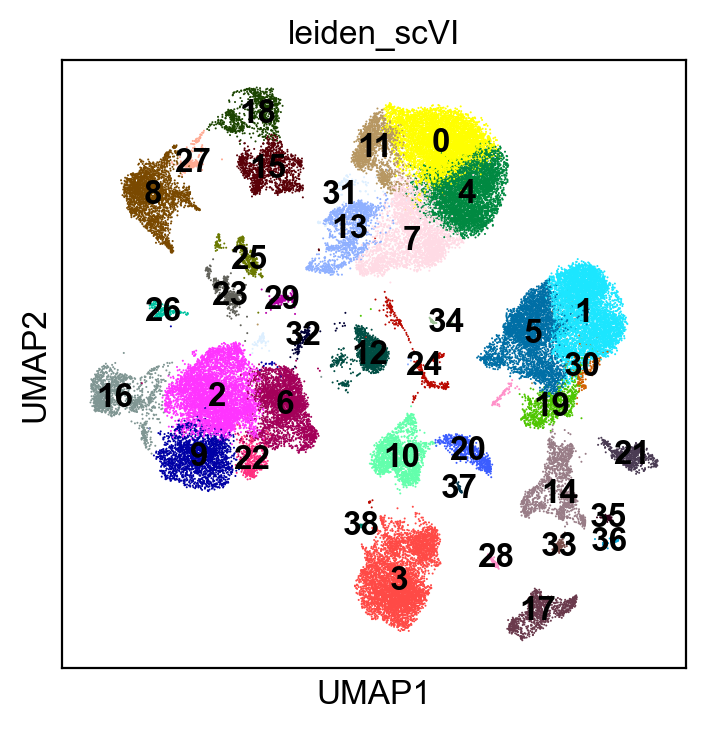

In [27]:
sc.pl.umap(adata_postnorm_scvi,color=['leiden_scVI'], legend_loc='on data')

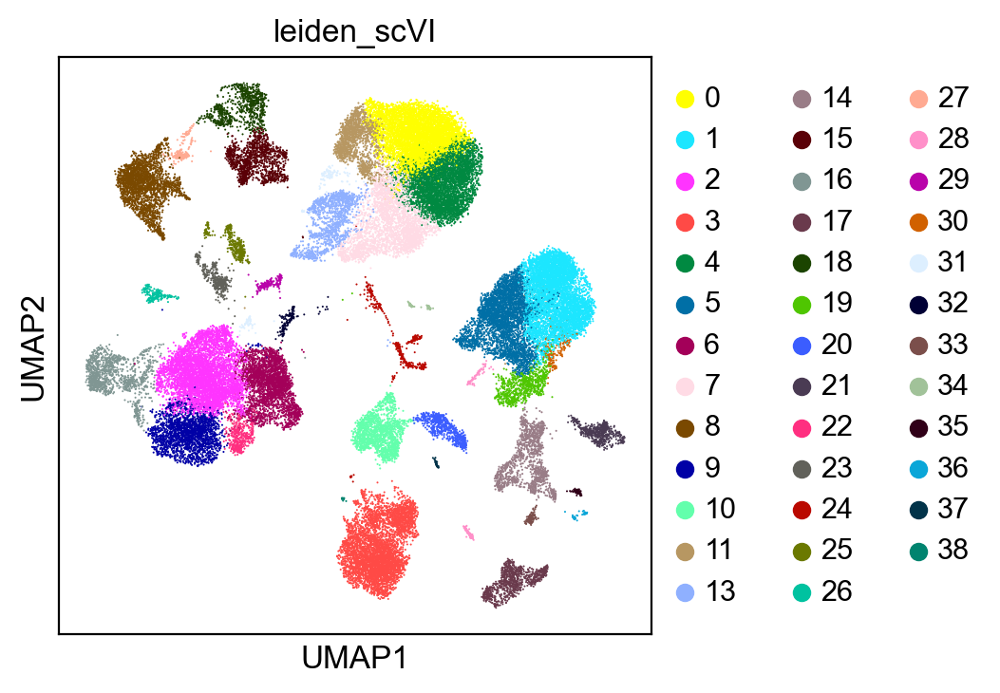

In [28]:
sc.pl.umap(adata_postnorm_scvi2,color=['leiden_scVI'])

In [29]:
adata_postnorm_scvi2.write(data_dir+today+'adata_postnorm_scvi2_no12.h5ad', compression='gzip')

In [30]:
data_dir+today+'adata_postnorm_scvi2_no12.h5ad'

'/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/data/230721adata_postnorm_scvi2_no12.h5ad'